In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
import warnings
warnings.filterwarnings("ignore") 

In [2]:
df=pd.read_csv("hr_analytics_attrition.csv")
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


EDA PROCESS

In [3]:
df.isna().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [4]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [5]:
df["Over18"].value_counts()

Y    1470
Name: Over18, dtype: int64

In [6]:
df["EmployeeCount"].value_counts()

1    1470
Name: EmployeeCount, dtype: int64

In [7]:
df["StandardHours"].value_counts()

80    1470
Name: StandardHours, dtype: int64

In [8]:
df.drop(["Over18","EmployeeCount","StandardHours"],axis=1,inplace=True)

In [9]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,2,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,2,3,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,4,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,5,4,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,7,1,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,2061,3,...,3,3,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,2062,4,...,3,1,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2064,2,...,4,2,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,2065,4,...,3,4,0,17,3,2,9,6,0,8


In [10]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StockOptionLevel             int64
TotalWorkingYears            int64
TrainingTimesLastYear        int64
WorkLifeBalance              int64
YearsAtCompany      

LABEL ENCODER

In [11]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
list=['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
       'JobRole', 'MaritalStatus','OverTime']
for val in list:
    df[val]=le.fit_transform(df[val].astype(str))
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,1,2,...,3,1,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,2,3,...,4,4,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,4,4,...,3,2,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,5,4,...,3,3,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,7,1,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,1,884,1,23,2,3,2061,3,...,3,3,1,17,3,3,5,2,0,3
1466,39,0,2,613,1,6,1,3,2062,4,...,3,1,1,9,5,3,7,7,1,7
1467,27,0,2,155,1,4,3,1,2064,2,...,4,2,1,6,0,3,6,2,0,3
1468,49,0,1,1023,2,2,3,3,2065,4,...,3,4,0,17,3,2,9,6,0,8


<AxesSubplot:xlabel='Attrition', ylabel='BusinessTravel'>

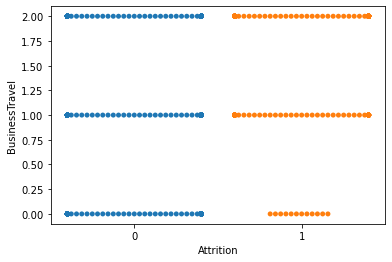

In [55]:
sns.swarmplot(x="Attrition",y="BusinessTravel",data=df)

<AxesSubplot:xlabel='Attrition', ylabel='YearsAtCompany'>

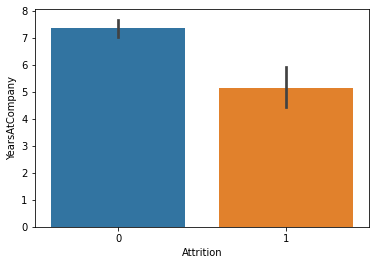

In [58]:
sns.barplot(x="Attrition",y="YearsAtCompany",data=df)

<AxesSubplot:xlabel='Attrition', ylabel='WorkLifeBalance'>

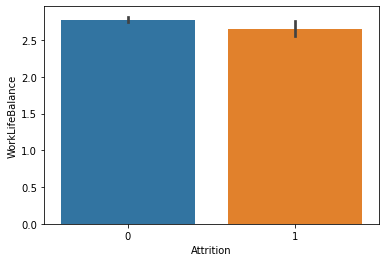

In [60]:
sns.barplot(x="Attrition",y="WorkLifeBalance",data=df)

<AxesSubplot:xlabel='Attrition', ylabel='YearsWithCurrManager'>

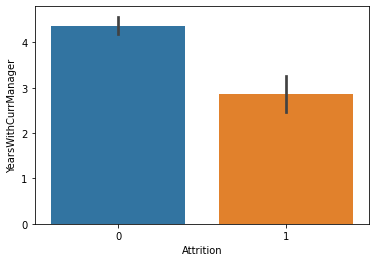

In [61]:
sns.barplot(x="Attrition",y="YearsWithCurrManager",data=df)

<AxesSubplot:xlabel='Attrition', ylabel='DistanceFromHome'>

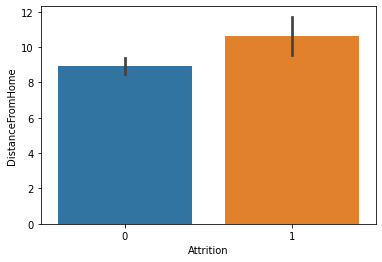

In [62]:
sns.barplot(x="Attrition",y="DistanceFromHome",data=df)

<AxesSubplot:xlabel='Attrition', ylabel='YearsInCurrentRole'>

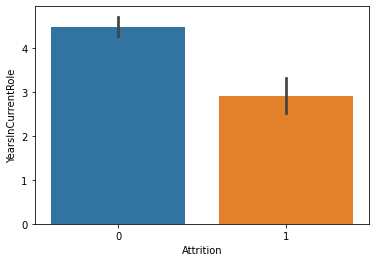

In [64]:
sns.barplot(x="Attrition",y="YearsInCurrentRole",data=df)

<Figure size 1440x1440 with 0 Axes>

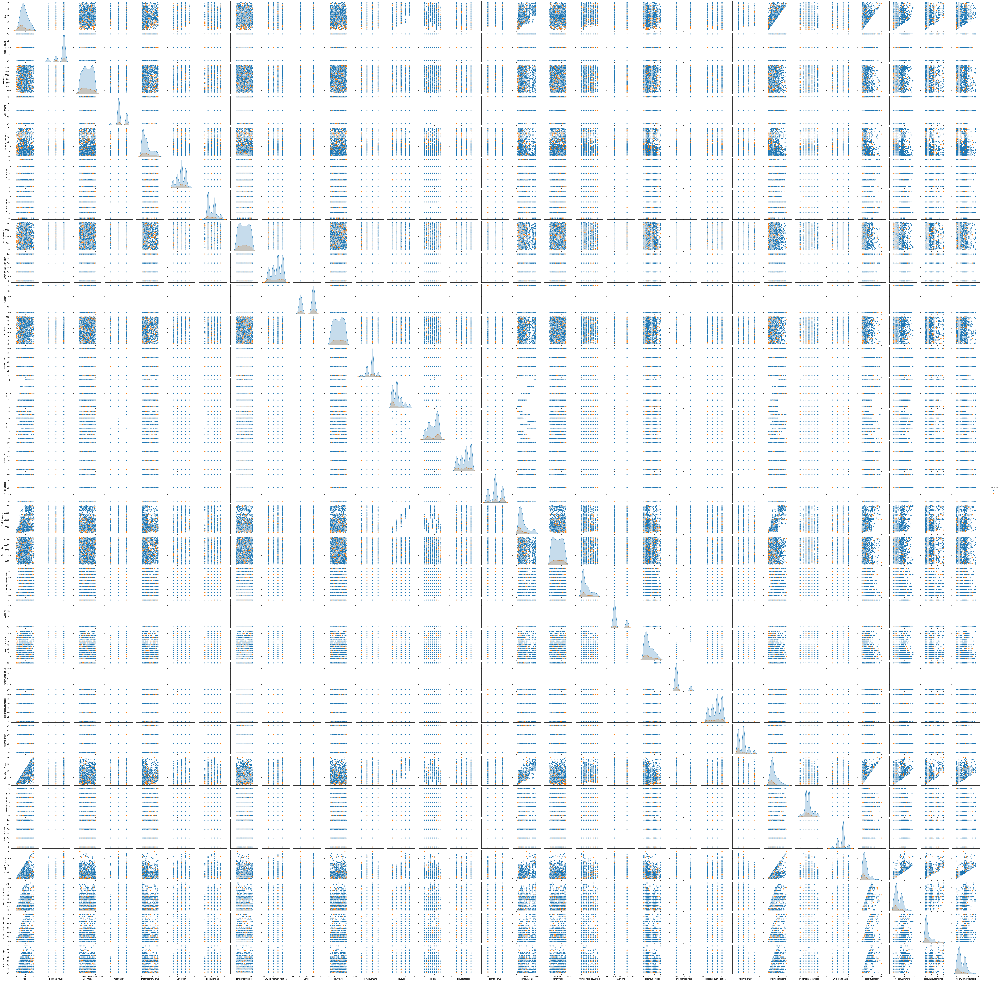

In [68]:
plt.figure(figsize=(20,20))
sns.pairplot(df,hue="Attrition")
plt.show()

In [12]:
df.describe()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,0.161224,1.607483,802.485714,1.260544,9.192517,2.912925,2.247619,1024.865306,2.721769,...,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,0.367863,0.665455,403.509100,0.527792,8.106864,1.024165,1.331369,602.024335,1.093082,...,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,0.000000,0.000000,102.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,0.000000,1.000000,465.000000,1.000000,2.000000,2.000000,1.000000,491.250000,2.000000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,0.000000,2.000000,802.000000,1.000000,7.000000,3.000000,2.000000,1020.500000,3.000000,...,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,0.000000,2.000000,1157.000000,2.000000,14.000000,4.000000,3.000000,1555.750000,4.000000,...,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1.000000,2.000000,1499.000000,2.000000,29.000000,5.000000,5.000000,2068.000000,4.000000,...,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [13]:
df.skew()

Age                         0.413286
Attrition                   1.844366
BusinessTravel             -1.439006
DailyRate                  -0.003519
Department                  0.172231
DistanceFromHome            0.958118
Education                  -0.289681
EducationField              0.550371
EmployeeNumber              0.016574
EnvironmentSatisfaction    -0.321654
Gender                     -0.408665
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    1.025401
JobRole                    -0.357270
JobSatisfaction            -0.329672
MaritalStatus              -0.152175
MonthlyIncome               1.369817
MonthlyRate                 0.018578
NumCompaniesWorked          1.026471
OverTime                    0.964489
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StockOptionLevel            0.968980
TotalWorkingYears           1.117172
TrainingTimesLastYear       0.553124
W

Age                           AxesSubplot(0.125,0.799681;0.0824468x0.0803191)
Attrition                   AxesSubplot(0.223936,0.799681;0.0824468x0.0803...
BusinessTravel              AxesSubplot(0.322872,0.799681;0.0824468x0.0803...
DailyRate                   AxesSubplot(0.421809,0.799681;0.0824468x0.0803...
Department                  AxesSubplot(0.520745,0.799681;0.0824468x0.0803...
DistanceFromHome            AxesSubplot(0.619681,0.799681;0.0824468x0.0803...
Education                   AxesSubplot(0.718617,0.799681;0.0824468x0.0803...
EducationField              AxesSubplot(0.817553,0.799681;0.0824468x0.0803...
EmployeeNumber                AxesSubplot(0.125,0.703298;0.0824468x0.0803191)
EnvironmentSatisfaction     AxesSubplot(0.223936,0.703298;0.0824468x0.0803...
Gender                      AxesSubplot(0.322872,0.703298;0.0824468x0.0803...
HourlyRate                  AxesSubplot(0.421809,0.703298;0.0824468x0.0803...
JobInvolvement              AxesSubplot(0.520745,0.703298;0.0824

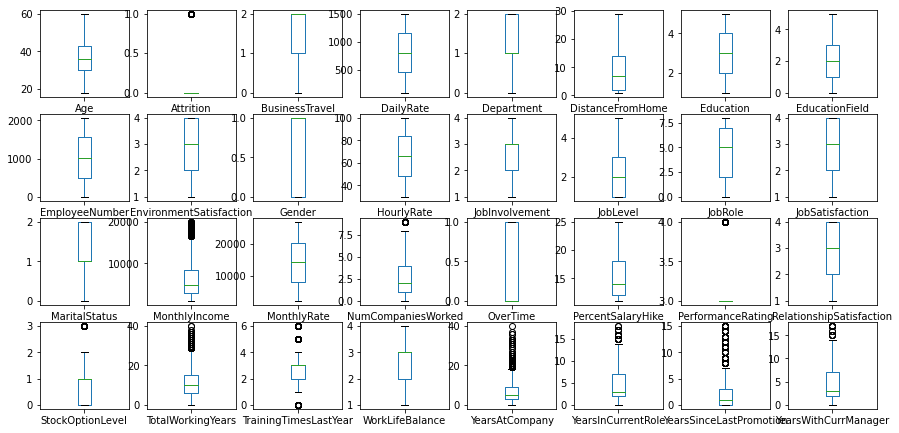

In [14]:
df.plot(kind="box",subplots=True,layout=(8,8),figsize=(15,15))

Z SCORE METHOD

In [15]:
from scipy.stats import zscore
z=np.abs(zscore(df))
z

array([[0.4463504 , 2.28090588, 0.59004834, ..., 0.0632959 , 0.67914568,
        0.24583399],
       [1.32236521, 0.4384223 , 0.91319439, ..., 0.76499762, 0.36871529,
        0.80654148],
       [0.008343  , 2.28090588, 0.59004834, ..., 1.16768726, 0.67914568,
        1.15593471],
       ...,
       [1.08667552, 0.4384223 , 0.59004834, ..., 0.61549158, 0.67914568,
        0.31487349],
       [1.32236521, 0.4384223 , 0.91319439, ..., 0.48889978, 0.67914568,
        1.08689522],
       [0.32016256, 0.4384223 , 0.59004834, ..., 0.33939374, 0.36871529,
        0.59522723]])

In [16]:
df_new=df[(z<3).all(axis=1)]
df_new

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,1,2,...,3,1,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,2,3,...,4,4,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,4,4,...,3,2,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,5,4,...,3,3,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,7,1,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,1,884,1,23,2,3,2061,3,...,3,3,1,17,3,3,5,2,0,3
1466,39,0,2,613,1,6,1,3,2062,4,...,3,1,1,9,5,3,7,7,1,7
1467,27,0,2,155,1,4,3,1,2064,2,...,4,2,1,6,0,3,6,2,0,3
1468,49,0,1,1023,2,2,3,3,2065,4,...,3,4,0,17,3,2,9,6,0,8


In [17]:
df.shape

(1470, 32)

In [18]:
1387/1470

0.9435374149659864

In [19]:
df_new.skew()

Age                         0.472280
Attrition                   1.805983
BusinessTravel             -1.426774
DailyRate                  -0.017078
Department                  0.183919
DistanceFromHome            0.954752
Education                  -0.289024
EducationField              0.544868
EmployeeNumber              0.018931
EnvironmentSatisfaction    -0.325285
Gender                     -0.417296
HourlyRate                 -0.030481
JobInvolvement             -0.501401
JobLevel                    1.126075
JobRole                    -0.386843
JobSatisfaction            -0.345612
MaritalStatus              -0.160952
MonthlyIncome               1.544770
MonthlyRate                 0.030596
NumCompaniesWorked          1.037715
OverTime                    0.954751
PercentSalaryHike           0.800592
PerformanceRating           1.931566
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
TrainingTimesLastYear       0.577614
W

BOXCOX METHOD

In [20]:
list=['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
        'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager']
for i in list:
    vc=df_new[i].value_counts()
    print(vc)

34    77
35    77
31    69
29    68
36    67
32    61
30    60
33    58
38    57
40    54
37    49
27    48
28    48
42    40
39    40
26    39
45    38
41    33
43    31
46    29
44    29
24    26
25    26
50    24
49    22
47    19
48    17
22    16
55    16
53    15
54    15
23    14
52    14
51    14
21    13
20    11
58    10
56    10
19     9
59     9
18     8
57     4
60     3
Name: Age, dtype: int64
0    1158
1     229
Name: Attrition, dtype: int64
2    981
1    263
0    143
Name: BusinessTravel, dtype: int64
691     6
1329    5
1082    5
530     5
408     5
       ..
913     1
911     1
905     1
902     1
102     1
Name: DailyRate, Length: 862, dtype: int64
1    909
2    420
0     58
Name: Department, dtype: int64
1     199
2     197
10     82
3      80
9      80
7      76
8      75
5      64
4      59
6      55
16     31
11     29
24     28
29     25
23     25
15     25
18     24
20     24
25     23
19     22
26     22
28     21
17     20
14     19
13     18
12     18
21    

In [21]:
df_new["OverTime"]=df_new["OverTime"].replace([0,1],[1,2])
df_new["BusinessTravel"]=df_new["BusinessTravel"].replace([0,1,2],[1,2,3])
df_new["StockOptionLevel"]=df_new["StockOptionLevel"].replace([0,1,2,3],[1,2,3,4])
df_new["NumCompaniesWorked"]=df_new["NumCompaniesWorked"].replace(0,1)
df_new["TotalWorkingYears"]=df_new["TotalWorkingYears"].replace(0,1)
df_new["YearsAtCompany"]=df_new["YearsAtCompany"].replace(0,1)
df_new["YearsSinceLastPromotion"]=df_new["YearsSinceLastPromotion"].replace(0,1)
df_new["YearsInCurrentRole"]=df_new["YearsInCurrentRole"].replace(0,1)

In [22]:
values=["BusinessTravel","JobLevel","MonthlyIncome","DistanceFromHome","OverTime","StockOptionLevel","NumCompaniesWorked","PerformanceRating","PercentSalaryHike","TotalWorkingYears","YearsAtCompany","YearsSinceLastPromotion","YearsInCurrentRole"]
from scipy.stats import boxcox
for i in values:
    df_new[i]=boxcox(df_new[i],0.5)
df_new.skew()

Age                         0.472280
Attrition                   1.805983
BusinessTravel             -1.605120
DailyRate                  -0.017078
Department                  0.183919
DistanceFromHome            0.394018
Education                  -0.289024
EducationField              0.544868
EmployeeNumber              0.018931
EnvironmentSatisfaction    -0.325285
Gender                     -0.417296
HourlyRate                 -0.030481
JobInvolvement             -0.501401
JobLevel                    0.649012
JobRole                    -0.386843
JobSatisfaction            -0.345612
MaritalStatus              -0.160952
MonthlyIncome               0.950248
MonthlyRate                 0.030596
NumCompaniesWorked          0.813501
OverTime                    0.954751
PercentSalaryHike           0.636544
PerformanceRating           1.931566
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.580948
TotalWorkingYears           0.156961
TrainingTimesLastYear       0.577614
W

CORRELATION GRAPH

In [23]:
df_new.corr()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159366,0.021287,0.021946,-0.038242,-0.021908,0.198502,-0.032676,-0.002704,0.014098,...,-0.000617,0.041744,0.063876,0.635063,-0.019008,-0.016913,0.170937,0.122400,0.104494,0.121747
Attrition,-0.159366,1.000000,0.008251,-0.057220,0.063637,0.082753,-0.032703,0.023585,-0.010169,-0.112393,...,0.010781,-0.052344,-0.153188,-0.217013,-0.057285,-0.062492,-0.191823,-0.171177,-0.022408,-0.162297
BusinessTravel,0.021287,0.008251,1.000000,-0.005997,-0.003535,-0.024599,-0.011720,0.020393,-0.014603,0.000176,...,-0.017315,-0.027778,-0.016047,0.028613,0.011291,-0.013059,-0.027476,-0.031108,-0.023612,-0.043929
DailyRate,0.021946,-0.057220,-0.005997,1.000000,-0.005398,-0.005770,-0.018442,0.040645,-0.044886,0.033123,...,0.000574,0.004516,0.048397,0.042755,0.005861,-0.044266,0.002106,0.018162,-0.037474,-0.011516
Department,-0.038242,0.063637,-0.003535,-0.005398,1.000000,0.032139,0.012846,0.013432,-0.007828,-0.014540,...,-0.039364,-0.037705,-0.002301,-0.008013,0.036092,0.026978,0.033827,0.068493,0.052926,0.034216
DistanceFromHome,-0.021908,0.082753,-0.024599,-0.005770,0.032139,1.000000,0.002868,0.009220,0.033564,-0.014969,...,0.017723,0.009331,0.039223,-0.004849,-0.024032,-0.031222,0.008242,0.014864,-0.001168,0.000687
Education,0.198502,-0.032703,-0.011720,-0.018442,0.012846,0.002868,1.000000,-0.038017,0.042707,-0.026223,...,-0.023487,-0.002393,0.028216,0.148825,-0.026879,0.007844,0.037729,0.051710,0.046934,0.031210
EducationField,-0.032676,0.023585,0.020393,0.040645,0.013432,0.009220,-0.038017,1.000000,0.000058,0.047924,...,-0.003621,-0.013734,-0.016258,-0.008872,0.050502,0.034038,0.000152,-0.010325,0.031029,0.013437
EmployeeNumber,-0.002704,-0.010169,-0.014603,-0.044886,-0.007828,0.033564,0.042707,0.000058,1.000000,0.011003,...,-0.027355,-0.063017,0.061211,-0.005418,0.018555,0.006280,0.014101,-0.002102,-0.006668,-0.006224
EnvironmentSatisfaction,0.014098,-0.112393,0.000176,0.033123,-0.014540,-0.014969,-0.026223,0.047924,0.011003,1.000000,...,-0.025299,0.018414,0.018088,-0.011859,-0.019318,0.032492,0.014392,0.038371,0.022432,0.001606


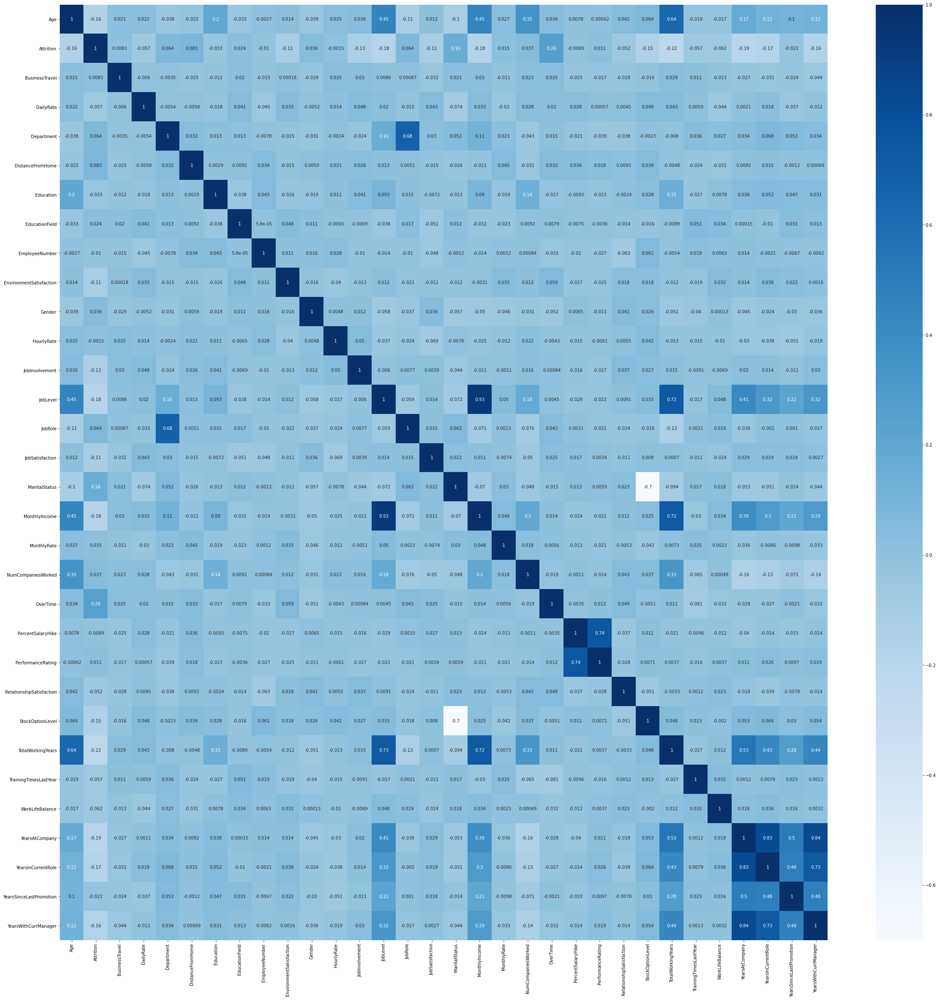

In [24]:
plt.figure(figsize=(40,40))
sns.heatmap(df_new.corr(),annot=True,cmap="Blues")
plt.show()

CHECKING FOR VIF FACTOR

In [25]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
x=df_new.iloc[:,df_new.columns != 'Attrition']
x

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1.464102,1102,2,0.000000,2,1,1,2,0,...,1.464102,1,0.000000,3.656854,0,1,2.898979,2.000000,0.000000,5
1,49,0.828427,279,1,3.656854,1,1,2,3,1,...,2.000000,4,0.828427,4.324555,3,3,4.324555,3.291503,0.000000,7
2,37,1.464102,1373,1,0.828427,2,4,4,4,1,...,1.464102,2,0.000000,3.291503,3,3,0.000000,0.000000,0.000000,0
3,33,0.828427,1392,1,1.464102,4,1,5,4,0,...,1.464102,3,0.000000,3.656854,3,3,3.656854,3.291503,1.464102,0
4,27,1.464102,591,1,0.828427,1,3,7,1,1,...,1.464102,4,0.828427,2.898979,3,3,0.828427,0.828427,0.828427,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0.828427,884,1,7.591663,2,3,2061,3,1,...,1.464102,3,0.828427,6.246211,3,3,2.472136,0.828427,0.000000,3
1466,39,1.464102,613,1,2.898979,1,3,2062,4,1,...,1.464102,1,0.828427,4.000000,5,3,3.291503,3.291503,0.000000,7
1467,27,1.464102,155,1,2.000000,3,1,2064,2,1,...,2.000000,2,0.828427,2.898979,0,3,2.898979,0.828427,0.000000,3
1468,49,0.828427,1023,2,0.828427,3,3,2065,4,1,...,1.464102,4,0.000000,6.246211,3,2,4.000000,2.898979,0.000000,8


In [26]:
def calc_vif(x):
    vif=pd.DataFrame()
    vif["variable"]=x.columns
    vif["VIF factor"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    return(vif)

In [27]:
calc_vif(x)

,variable,VIF factor
0,Age,31.615747
1,BusinessTravel,7.278215
2,DailyRate,5.072667
3,Department,13.814004
4,DistanceFromHome,2.716744
5,Education,9.356890
6,EducationField,3.896372
7,EmployeeNumber,3.941497
8,EnvironmentSatisfaction,7.168878
9,Gender,2.545900


In [28]:
df_new.drop("MonthlyIncome",axis=1,inplace=True)

In [29]:
x=df_new.iloc[:,df_new.columns != 'Attrition']
x

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1.464102,1102,2,0.000000,2,1,1,2,0,...,1.464102,1,0.000000,3.656854,0,1,2.898979,2.000000,0.000000,5
1,49,0.828427,279,1,3.656854,1,1,2,3,1,...,2.000000,4,0.828427,4.324555,3,3,4.324555,3.291503,0.000000,7
2,37,1.464102,1373,1,0.828427,2,4,4,4,1,...,1.464102,2,0.000000,3.291503,3,3,0.000000,0.000000,0.000000,0
3,33,0.828427,1392,1,1.464102,4,1,5,4,0,...,1.464102,3,0.000000,3.656854,3,3,3.656854,3.291503,1.464102,0
4,27,1.464102,591,1,0.828427,1,3,7,1,1,...,1.464102,4,0.828427,2.898979,3,3,0.828427,0.828427,0.828427,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0.828427,884,1,7.591663,2,3,2061,3,1,...,1.464102,3,0.828427,6.246211,3,3,2.472136,0.828427,0.000000,3
1466,39,1.464102,613,1,2.898979,1,3,2062,4,1,...,1.464102,1,0.828427,4.000000,5,3,3.291503,3.291503,0.000000,7
1467,27,1.464102,155,1,2.000000,3,1,2064,2,1,...,2.000000,2,0.828427,2.898979,0,3,2.898979,0.828427,0.000000,3
1468,49,0.828427,1023,2,0.828427,3,3,2065,4,1,...,1.464102,4,0.000000,6.246211,3,2,4.000000,2.898979,0.000000,8


In [113]:
calc_vif(x)

,variable,VIF factor
0,Age,31.439136
1,BusinessTravel,7.170539
2,DailyRate,5.037389
3,Department,13.794342
4,DistanceFromHome,2.714764
5,Education,9.333524
6,EducationField,3.886442
7,EmployeeNumber,3.931073
8,EnvironmentSatisfaction,7.160960
9,Gender,2.536133


SMOTE PROCESS -as our target column is imbalanced

In [30]:
dfx=df_new.iloc[:,df_new.columns != 'Attrition']
dfx

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1.464102,1102,2,0.000000,2,1,1,2,0,...,1.464102,1,0.000000,3.656854,0,1,2.898979,2.000000,0.000000,5
1,49,0.828427,279,1,3.656854,1,1,2,3,1,...,2.000000,4,0.828427,4.324555,3,3,4.324555,3.291503,0.000000,7
2,37,1.464102,1373,1,0.828427,2,4,4,4,1,...,1.464102,2,0.000000,3.291503,3,3,0.000000,0.000000,0.000000,0
3,33,0.828427,1392,1,1.464102,4,1,5,4,0,...,1.464102,3,0.000000,3.656854,3,3,3.656854,3.291503,1.464102,0
4,27,1.464102,591,1,0.828427,1,3,7,1,1,...,1.464102,4,0.828427,2.898979,3,3,0.828427,0.828427,0.828427,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0.828427,884,1,7.591663,2,3,2061,3,1,...,1.464102,3,0.828427,6.246211,3,3,2.472136,0.828427,0.000000,3
1466,39,1.464102,613,1,2.898979,1,3,2062,4,1,...,1.464102,1,0.828427,4.000000,5,3,3.291503,3.291503,0.000000,7
1467,27,1.464102,155,1,2.000000,3,1,2064,2,1,...,2.000000,2,0.828427,2.898979,0,3,2.898979,0.828427,0.000000,3
1468,49,0.828427,1023,2,0.828427,3,3,2065,4,1,...,1.464102,4,0.000000,6.246211,3,2,4.000000,2.898979,0.000000,8


In [31]:
dfy=df_new.iloc[:,1]
dfy

0       1
1       0
2       1
3       0
4       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Attrition, Length: 1387, dtype: int32

In [32]:
from imblearn.over_sampling import SMOTE
smt=SMOTE()
trainx,trainy=smt.fit_resample(dfx,dfy)

In [33]:
trainx.value_counts()

Age  BusinessTravel  DailyRate  Department  DistanceFromHome  Education  EducationField  EmployeeNumber  EnvironmentSatisfaction  Gender  HourlyRate  JobInvolvement  JobLevel  JobRole  JobSatisfaction  MaritalStatus  MonthlyRate  NumCompaniesWorked  OverTime  PercentSalaryHike  PerformanceRating  RelationshipSatisfaction  StockOptionLevel  TotalWorkingYears  TrainingTimesLastYear  WorkLifeBalance  YearsAtCompany  YearsInCurrentRole  YearsSinceLastPromotion  YearsWithCurrManager
60   1.464102        1179       2           6.000000          4          2               732             1                        1       84          3               0.828427  7        1                2              11924        3.656854            0.000000  5.483315           1.464102           4                         0.000000          4.324555           1                      3                0.828427        0.828427            0.828427                 2                       1
30   0.828427        721     

In [34]:
trainy.value_counts()

1    1158
0    1158
Name: Attrition, dtype: int64

STANDARD SCALER

In [35]:
from sklearn.preprocessing import StandardScaler
scale=StandardScaler()
trainx=scale.fit_transform(trainx)

In [36]:
trainx

array([[ 0.73897861,  0.63327995,  0.83750815, ...,  0.37713039,
        -0.60959212,  0.63158593],
       [ 1.67357218, -0.8755427 , -1.30469669, ...,  1.33732346,
        -0.60959212,  1.30012022],
       [ 0.27168183,  0.63327995,  1.54290002, ..., -1.10980902,
        -0.60959212, -1.03974978],
       ...,
       [ 1.55674799, -0.25951493,  0.65270068, ...,  0.53340754,
        -0.60959212, -0.03694835],
       [-0.77973593, -0.45886039,  0.44706984, ..., -1.10980902,
        -0.60959212, -1.03974978],
       [ 0.97262701,  0.63327995, -0.30517463, ...,  1.13795393,
        -0.60959212,  0.29731879]])

MACHINE LEARNING PROCESS

In [37]:
max_acc=0
max_rs=0

for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(trainx,trainy,test_size=.30,random_state=i) 
    m=RandomForestClassifier()
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    predm=m.predict(x_test)
    acc=accuracy_score(predm,y_test)   
       
    if acc>max_acc:
        max_acc=acc
        max_rs=i
print("best accuracy=",max_acc,"on random state",max_rs)

best accuracy= 0.9539568345323741 on random state 160


In [38]:
x_train,x_test,y_train,y_test=train_test_split(trainx,trainy,test_size=.30,random_state=160)

In [39]:
model=[LogisticRegression(),DecisionTreeClassifier(),SVC(),RandomForestClassifier(),KNeighborsClassifier()]
for i in model:
    i.fit(x_train,y_train)
    pred_test=i.predict(x_test)
    print("testing score=",accuracy_score(pred_test,y_test))         
    print("training score=",i.score(x_train,y_train))
    print(confusion_matrix(pred_test,y_test))
    print(classification_report(pred_test,y_test),"\n")

testing score= 0.8517985611510791
training score= 0.8439235040098705
[[286  42]
 [ 61 306]]
              precision    recall  f1-score   support

           0       0.82      0.87      0.85       328
           1       0.88      0.83      0.86       367

    accuracy                           0.85       695
   macro avg       0.85      0.85      0.85       695
weighted avg       0.85      0.85      0.85       695
 

testing score= 0.8489208633093526
training score= 1.0
[[278  36]
 [ 69 312]]
              precision    recall  f1-score   support

           0       0.80      0.89      0.84       314
           1       0.90      0.82      0.86       381

    accuracy                           0.85       695
   macro avg       0.85      0.85      0.85       695
weighted avg       0.85      0.85      0.85       695
 

testing score= 0.9179856115107914
training score= 0.9555829734731647
[[315  25]
 [ 32 323]]
              precision    recall  f1-score   support

           0       0.91   

CROSS VALIDATION PROCESS

In [40]:
from sklearn.model_selection import cross_val_score
model=[LogisticRegression(),DecisionTreeClassifier(),SVC(),RandomForestClassifier(),KNeighborsClassifier()]
for i in model:
    score=cross_val_score(i,trainx,trainy,cv=10) 
    print("score=",score)
    print("mean_score=",score.mean())
    print("std=",score.std(),"\n")

score= [0.73706897 0.68534483 0.85344828 0.86206897 0.85775862 0.87931034
 0.83982684 0.85714286 0.84415584 0.80952381]
mean_score= 0.8225649350649352
std= 0.05936476165631643 

score= [0.68534483 0.6637931  0.90086207 0.9137931  0.875      0.90948276
 0.88311688 0.87445887 0.87445887 0.6017316 ]
mean_score= 0.81820420958352
std= 0.11243874711584932 

score= [0.73706897 0.73275862 0.95689655 0.94827586 0.95258621 0.95258621
 0.94372294 0.95238095 0.94372294 0.93939394]
mean_score= 0.9059393193013883
std= 0.08566263994919353 

score= [0.72413793 0.67672414 0.97844828 0.98706897 0.96982759 0.95258621
 0.96103896 0.99134199 0.97835498 0.97402597]
mean_score= 0.9193555008210181
std= 0.11049797421985148 

score= [0.79741379 0.82758621 0.84051724 0.81896552 0.79310345 0.85775862
 0.83982684 0.78787879 0.84415584 0.83116883]
mean_score= 0.8238375130616511
std= 0.02263782439571283 



HYPERPARAMETER TUNING PROCESS FOR THE BEST MODEL

In [43]:
from sklearn.model_selection import GridSearchCV

In [44]:
parameter={"gamma":["scale","auto"],
          "kernel": ["linear","poly","rbf","sigmoid"],
          "shrinking": [True,False],
          "probability": [True,False]}

In [45]:
gcv=GridSearchCV(SVC(),parameter,cv=5)

In [46]:
gcv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
                         'probability': [True, False],
                         'shrinking': [True, False]})

In [47]:
gcv.best_params_

{'gamma': 'auto', 'kernel': 'rbf', 'probability': True, 'shrinking': True}

In [48]:
final_model=SVC(gamma='auto',kernel='rbf',shrinking=True,probability=True)
final_model.fit(x_train,y_train)
pred=final_model.predict(x_test)
print(accuracy_score(pred,y_test))

0.9179856115107914


AUC-ROC CURVE

In [49]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [50]:
y_pred_prob=final_model.predict_proba(x_test)[:,1]
y_pred_prob

array([0.99999866, 0.00701335, 0.16162846, 0.96160614, 0.60450539,
       0.54519903, 0.03012977, 0.94580522, 0.48262054, 0.99180302,
       0.01428154, 0.88253177, 0.88981887, 0.96132714, 0.04751928,
       0.91049924, 0.00964278, 0.93467624, 0.0591588 , 0.9957207 ,
       0.52875494, 0.98633619, 0.04055622, 0.00253839, 0.96849898,
       0.69902369, 0.99738366, 0.97399979, 0.00432464, 0.73382579,
       0.06688476, 0.9999959 , 0.99139769, 0.07217632, 0.00372619,
       0.98494602, 0.9724479 , 0.99295132, 0.61282422, 0.93644628,
       0.13531335, 0.40264595, 0.05970022, 0.05837181, 0.9828105 ,
       0.01347448, 0.8570495 , 0.97147752, 0.07769216, 0.14394859,
       0.97778247, 0.96572116, 0.04065221, 0.10249027, 0.00148971,
       0.99257869, 0.64940865, 0.72710342, 0.96563493, 0.94886182,
       0.99103974, 0.98319751, 0.64430933, 0.85032352, 0.00375001,
       0.00358482, 0.1161844 , 0.87421951, 0.9999953 , 0.03339797,
       0.17885424, 0.73828299, 0.00656828, 0.13464337, 0.06936

In [51]:
fpr,tpr,thresholds=roc_curve(y_test,y_pred_prob)

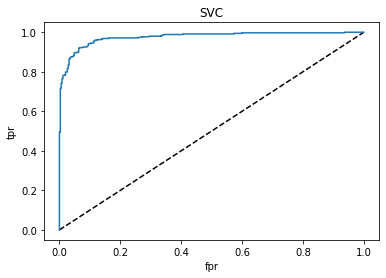

In [52]:
plt.plot([0,1],[0,1],"k--")
plt.plot(fpr,tpr,label="SVC")
plt.xlabel("fpr")
plt.ylabel("tpr")
plt.title("SVC")
plt.show()

SAVING THE BEST MODEL

In [53]:
import joblib

joblib.dump(final_model,"hr_analytics_attrition.obj")

['hr_analytics_attrition.obj']

In [54]:
hranalyticsattrition_from_joblib=joblib.load("hr_analytics_attrition.obj")
hranalyticsattrition_from_joblib.predict(x_test)

array([1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1,
       0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0,
       1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0,
       0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1,
       0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1,
       1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0,
       1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0,
       1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1,
       0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0,
       0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0,
       1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0,